Add gaussian noise with different parameters to an image.

In [ ]:
%matplotlib inline
import cv2
import skimage
from skimage import data

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from pylab import rcParams
rcParams['figure.figsize'] = 16,8
plt.gray()

<Figure size 1600x800 with 0 Axes>

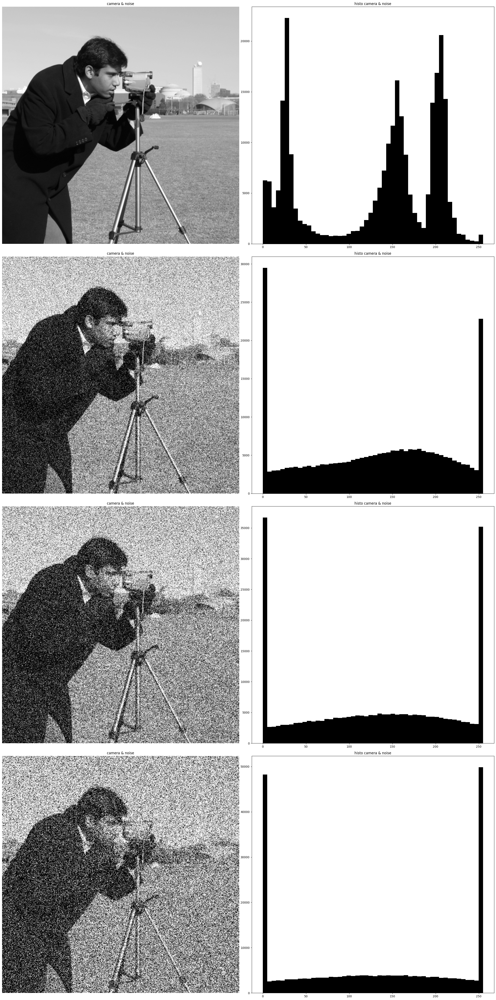

In [ ]:
import skimage.util
img = data.camera()
width, height =img.shape
f, ax = plt.subplots(4,2 , figsize=(24,48))
noise_per =[0,0.05,0.1,0.2 ]
for c, noise in enumerate(noise_per):
    img_noise= skimage.util.random_noise(img, mode='gaussian', var=noise)*255
#display
    ax[c, 0].set_title('camera & noise'.format(noise))
    ax[c, 0].imshow(img_noise, cmap='gray')
    ax[c, 0].axis('off')
    #histogram
    ax[c, 1].hist(img_noise.ravel(),bins=50, range=[0,255], color='black')
    ax[c, 1].set_title('histo camera & noise'.format(noise))
plt.tight_layout()
plt.show()

Apply median filter


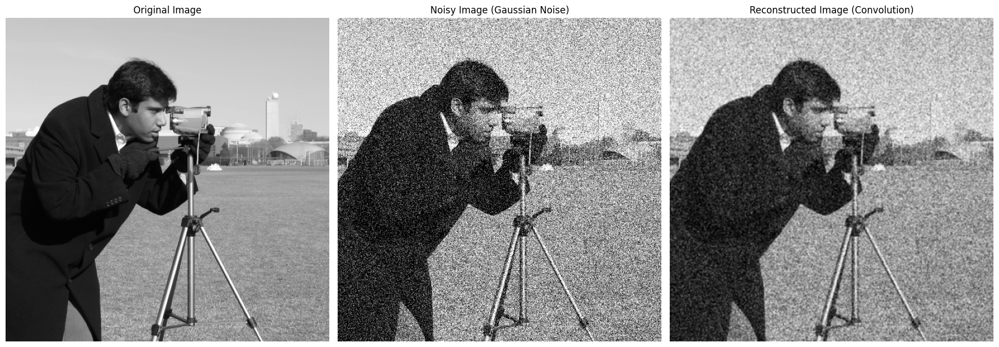

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, util
from scipy.signal import convolve2d

# Load an image and add Gaussian noise
img = data.camera()
noise_var = 0.05
img_noisy = util.random_noise(img, mode='gaussian', var=noise_var) * 255
img_noisy = img_noisy.astype(np.uint8)

# Define a reconstruction kernel (Gaussian kernel)
def gaussian_kernel(size, sigma=1):
    """Generates a Gaussian kernel."""
    x = np.linspace(-sigma, sigma, size)
    kernel1d = np.exp(-0.5 * x**2 / sigma**2)
    kernel2d = np.outer(kernel1d, kernel1d)
    return kernel2d / kernel2d.sum()

kernel_size = 3  # Size of the kernel (e.g., 5x5)
sigma = 1.0      # Standard deviation of the Gaussian
kernel = gaussian_kernel(kernel_size, sigma)

# Perform convolution for image reconstruction
img_reconstructed = convolve2d(img_noisy, kernel, mode='same', boundary='symm')

# Plot the results
plt.figure(figsize=(18, 12))

# Original image
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.title("Noisy Image (Gaussian Noise)")
plt.imshow(img_noisy, cmap='gray')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 3)
plt.title("Reconstructed Image (Convolution)")
plt.imshow(img_reconstructed, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


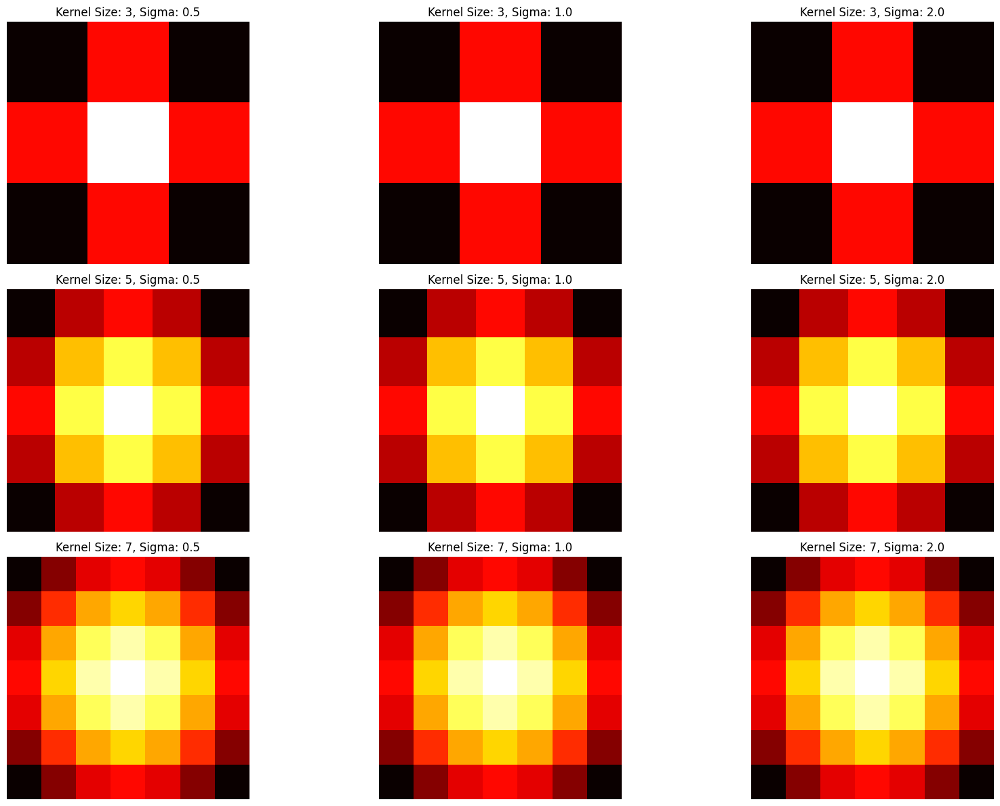

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def gaussian_kernel(size, sigma):
    """Generates a Gaussian kernel."""
    x = np.linspace(-sigma, sigma, size)
    kernel1d = np.exp(-0.5 * x**2 / sigma**2)
    kernel2d = np.outer(kernel1d, kernel1d)
    return kernel2d / kernel2d.sum()

# Define kernel sizes and sigma values
kernel_sizes = [3, 5, 7]
sigma_values = [0.5, 1.0, 2.0]

plt.figure(figsize=(18, 12))

for i, size in enumerate(kernel_sizes):
    for j, sigma in enumerate(sigma_values):
        kernel = gaussian_kernel(size, sigma)
        plt.subplot(len(kernel_sizes), len(sigma_values), i * len(sigma_values) + j + 1)
        plt.imshow(kernel, cmap='hot', interpolation='nearest')
        plt.title(f"Kernel Size: {size}, Sigma: {sigma}")
        plt.axis('off')

plt.tight_layout()
plt.show()


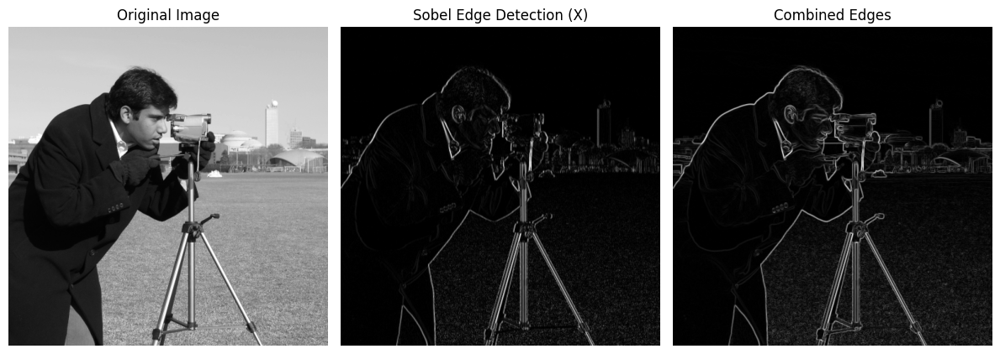

In [ ]:
import cv2
from scipy.signal import convolve2d

# Load an image
img = data.camera()

# Sobel Kernels
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

# Convolve with Sobel Kernels
edge_x = convolve2d(img, sobel_x, mode='same', boundary='symm')
edge_y = convolve2d(img, sobel_y, mode='same', boundary='symm')

# Combine the edges
edges = np.sqrt(edge_x**2 + edge_y**2)

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Sobel Edge Detection (X)")
plt.imshow(np.abs(edge_x), cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Combined Edges")
plt.imshow(edges, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


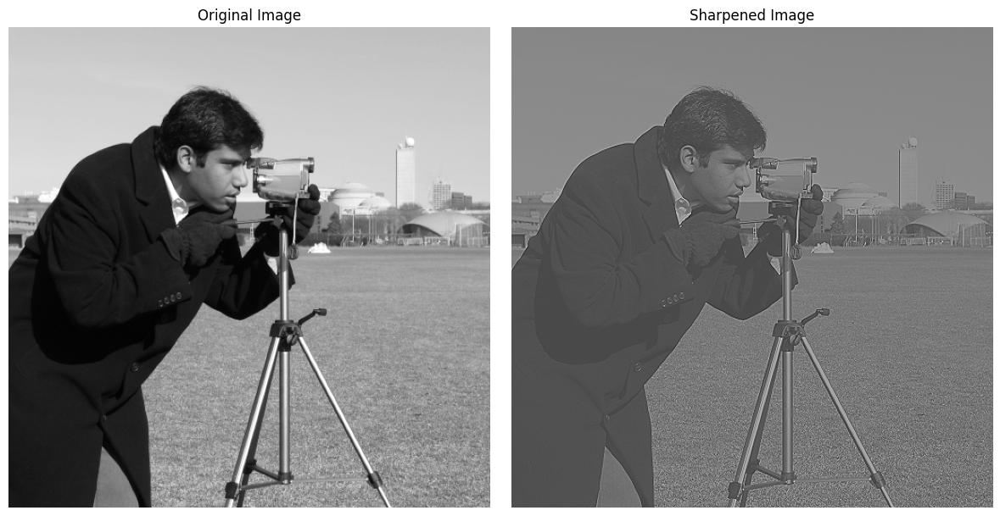

In [ ]:
# Sharpening Kernel
sharpening_kernel = np.array([[0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]])

# Apply sharpening
img_sharpened = convolve2d(img, sharpening_kernel, mode='same', boundary='symm')

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Sharpened Image")
plt.imshow(img_sharpened, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


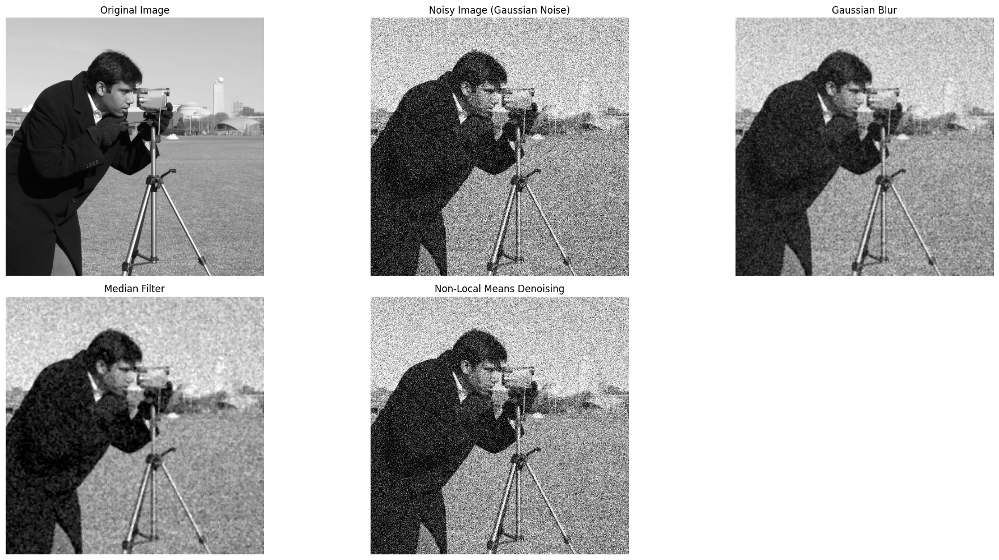

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, util

# Load the original image and add Gaussian noise
img = data.camera()  # Original image
noise_var = 0.05
noisy_img = util.random_noise(img, mode='gaussian', var=noise_var) * 255
noisy_img = noisy_img.astype(np.uint8)  # Convert to valid image format

# Apply Gaussian Blur
gaussian_blur = cv2.GaussianBlur(noisy_img, (5, 5), 1)

# Apply Median Filter
median_filter = cv2.medianBlur(noisy_img, 5)

# Apply Non-Local Means Denoising
nlm_denoised = cv2.fastNlMeansDenoising(noisy_img, None, 15, 7, 21)

# Plot the results
plt.figure(figsize=(20, 10))

# Original image
plt.subplot(2, 3, 1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

# Noisy image
plt.subplot(2, 3, 2)
plt.title("Noisy Image (Gaussian Noise)")
plt.imshow(noisy_img, cmap='gray')
plt.axis('off')

# Gaussian Blur
plt.subplot(2, 3, 3)
plt.title("Gaussian Blur")
plt.imshow(gaussian_blur, cmap='gray')
plt.axis('off')

# Median Filter
plt.subplot(2, 3, 4)
plt.title("Median Filter")
plt.imshow(median_filter, cmap='gray')
plt.axis('off')

# Non-Local Means Denoising
plt.subplot(2, 3, 5)
plt.title("Non-Local Means Denoising")
plt.imshow(nlm_denoised, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()
